In [15]:
library(corral)
library(Seurat)
library(tidyverse)

library(SingleCellExperiment)
library(ggplot2)
library(CellBench)
library(MultiAssayExperiment)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, 

ERROR: Error in library(CellBench): there is no package called ‘CellBench’


In [9]:
source('../01_milo/milo.R')

In [448]:
ref_obj = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_all_n2xo')
ref_obj = subset(ref_obj, batch == "Batch 1")
DefaultAssay(ref_obj) = 'integrated'

In [449]:
ref = ref_obj %>% prep_obj_for_milo %>% convert_obj_to_sce
ref

class: SingleCellExperiment 
dim: 3434 10711 
metadata(0):
assays(3): counts logcounts scaledata
rownames(3434): Gpc5 Slc4a4 ... Atp1b4 Gsdme
rowData names(0):
colnames(10711): ACTGTCCAGCAACAGC_2_1_1 CATTTCACAGTGCGCT_4_1_1 ...
  GAATCGTTCAAAGCCT_5_1_2 GGCAGTCAGTATTGCC_5_1_2
colData names(40): orig.ident nCount_RNA ... group ident
reducedDimNames(0):
mainExpName: integrated
altExpNames(2): RNA SCT

In [571]:
DefaultAssay(ref, "logcounts")
ref

ERROR: Error in UseMethod(generic = "DefaultAssay", object = object): no applicable method for 'DefaultAssay' applied to an object of class "c('SingleCellExperiment', 'RangedSummarizedExperiment', 'SummarizedExperiment', 'RectangularData', 'Vector', 'Annotated', 'vector_OR_Vector')"


In [450]:
xe_obj = qs::qread('xenium_a1_processed')
DefaultAssay(xe_obj) = 'Xenium'

In [451]:
cell_stats = read_csv('/data/petar/fgf1/resolve//baysor_segmentation//32810-1377-slide3_A1-1_results_baysor_results/baysor_cell_stats.csv')
cell_stats %>% head

Rows: 18986 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): cell
dbl (7): x, y, n_transcripts, density, elongation, area, avg_confidence

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


cell,x,y,n_transcripts,density,elongation,area,avg_confidence
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cell1_4012_26,4011.529,26.44203,138,0.04986,1.381,2768,0.9854
Cell2_4020_72,4020.296,71.72959,196,0.05998,1.831,3268,0.9927
Cell3_3895_189,3894.667,189.22222,117,0.04684,4.285,2498,0.9858
Cell4_3880_239,3879.782,239.14523,482,0.07543,1.157,6390,0.9974
Cell5_4017_126,4016.688,125.86458,192,0.06028,1.188,3185,0.9919
Cell6_3803_344,3803.318,344.18750,176,0.05479,1.858,3212,0.9909


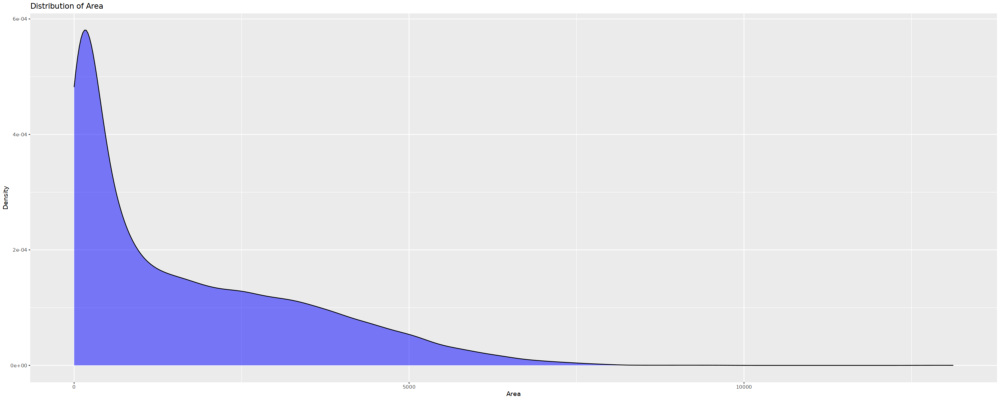

In [452]:
ggplot(cell_stats, aes(x = area)) +
  geom_density(fill = "blue", alpha = 0.5) +
  xlab("Area") +
  ylab("Density") +
  ggtitle("Distribution of Area")

In [453]:
cell_stats %>%
  summarize(cutoff_90 = quantile(area, 0.9),
            cutoff_10 = quantile(area, 0.1))


cutoff_90,cutoff_10
<dbl>,<dbl>
4312,51.5


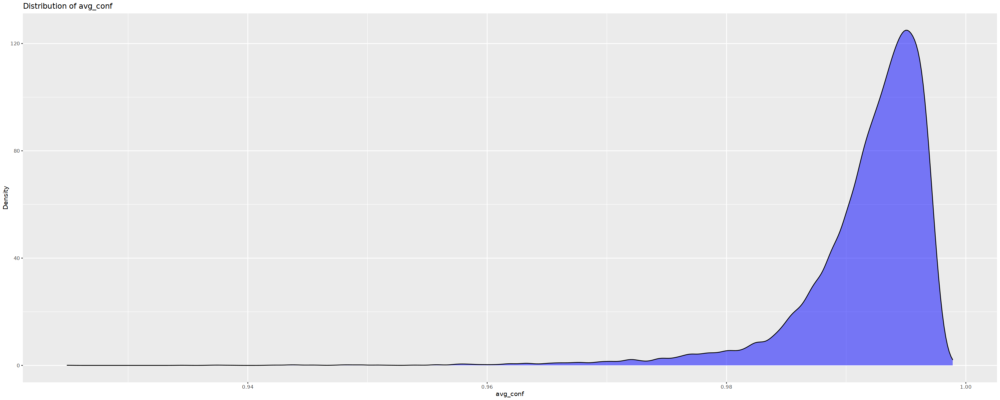

In [454]:
ggplot(cell_stats, aes(x = avg_confidence)) +
  geom_density(fill = "blue", alpha = 0.5) +
  xlab("avg_conf") +
  ylab("Density") +
  ggtitle("Distribution of avg_conf")

In [455]:
keep_cells = cell_stats %>%
filter(area < 4300) %>%
filter(area > 52) %>%
filter(avg_confidence >= 0.995) %>%
pull(cell)

length(keep_cells)

[1] 14373

In [456]:
xe_obj = subset(xe_obj, cells = keep_cells)
xe_obj

An object of class Seurat 
499 features across 14373 samples within 5 assays 
Active assay: Xenium (100 features, 0 variable features)
 4 other assays present: BlankCodeword, ControlCodeword, ControlProbe, SCT
 2 dimensional reductions calculated: pca, umap
 2 spatial fields of view present: fov zoom

In [457]:
xe = xe_obj %>% convert_obj_to_sce 
xe

class: SingleCellExperiment 
dim: 100 14373 
metadata(0):
assays(2): counts logcounts
rownames(100): Sorcs1 Lingo2 ... Csmd1 Lmx1a
rowData names(0):
colnames(14373): Cell1_4012_26 Cell2_4020_72 ... Cell18970_4963_1934
  Cell18974_10371_1594
colData names(14): orig.ident nCount_Xenium ... seurat_clusters ident
reducedDimNames(0):
mainExpName: Xenium
altExpNames(4): BlankCodeword ControlCodeword ControlProbe SCT

In [458]:
scmix_dat = list(ref = ref, xe = xe)

In [459]:
scmix_dat

$ref
class: SingleCellExperiment 
dim: 3434 10711 
metadata(0):
assays(3): counts logcounts scaledata
rownames(3434): Gpc5 Slc4a4 ... Atp1b4 Gsdme
rowData names(0):
colnames(10711): ACTGTCCAGCAACAGC_2_1_1 CATTTCACAGTGCGCT_4_1_1 ...
  GAATCGTTCAAAGCCT_5_1_2 GGCAGTCAGTATTGCC_5_1_2
colData names(40): orig.ident nCount_RNA ... group ident
reducedDimNames(0):
mainExpName: integrated
altExpNames(2): RNA SCT

$xe
class: SingleCellExperiment 
dim: 100 14373 
metadata(0):
assays(2): counts logcounts
rownames(100): Sorcs1 Lingo2 ... Csmd1 Lmx1a
rowData names(0):
colnames(14373): Cell1_4012_26 Cell2_4020_72 ... Cell18970_4963_1934
  Cell18974_10371_1594
colData names(14): orig.ident nCount_Xenium ... seurat_clusters ident
reducedDimNames(0):
mainExpName: Xenium
altExpNames(4): BlankCodeword ControlCodeword ControlProbe SCT


In [600]:
platforms <- c('10X', 'Resolve')
for(i in seq_along(scmix_dat)) {
  colData(scmix_dat[[i]])$Method<- rep(platforms[i], ncol(scmix_dat[[i]]))
}

scmix_mae <- as(scmix_dat,'MultiAssayExperiment')
scmix_dat <- as.list(MultiAssayExperiment::experiments(MultiAssayExperiment::intersectRows(scmix_mae)))
scmix_dat$ref = swapAltExp(scmix_dat$ref, 'integrated')

In [601]:
scmix_dat

$ref
class: SingleCellExperiment 
dim: 98 10711 
metadata(0):
assays(3): counts logcounts scaledata
rownames(98): Gpc5 Il1rapl2 ... Gtdc1 Pomc
rowData names(0):
colnames(10711): ACTGTCCAGCAACAGC_2_1_1 CATTTCACAGTGCGCT_4_1_1 ...
  GAATCGTTCAAAGCCT_5_1_2 GGCAGTCAGTATTGCC_5_1_2
colData names(41): orig.ident nCount_RNA ... ident Method
reducedDimNames(0):
mainExpName: integrated
altExpNames(2): SCT RNA

$xe
class: SingleCellExperiment 
dim: 98 14373 
metadata(0):
assays(2): counts logcounts
rownames(98): Plcl1 Brinp3 ... Arhgap6 Fgf13
rowData names(0):
colnames(14373): Cell1_4012_26 Cell2_4020_72 ... Cell18970_4963_1934
  Cell18974_10371_1594
colData names(15): orig.ident nCount_Xenium ... ident Method
reducedDimNames(0):
mainExpName: Xenium
altExpNames(4): BlankCodeword ControlCodeword ControlProbe SCT


In [602]:
corral_results = corralm(scmix_dat, ncomp=30, whichmat = 'logcounts', smooth=TRUE)

In [ ]:
merged_obj = merge(ref_obj, xe_obj, ass)
merged_obj

In [593]:
merged_obj %>% `[[` %>% head

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,nFeature_integrated,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,SCT_snn_res.0.3
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<chr>
ACTGTCCAGCAACAGC_2_1_1,SI-TT-E10,46736,6509,SI-TT-E10,2114,12,D702,7575,3082,39161,⋯,0,NA,NA,NA,NA,NA,NA,NA,NA,NA
CATTTCACAGTGCGCT_4_1_1,SI-TT-G10,16462,4168,SI-TT-G10,800,12,D704,2507,1446,13955,⋯,0,NA,NA,NA,NA,NA,NA,NA,NA,NA
CTGCTCAGTGTCCTAA_5_1_1,SI-TT-H10,16599,4348,SI-TT-H10,968,12,D705,2656,1611,13943,⋯,0,NA,NA,NA,NA,NA,NA,NA,NA,NA
TTCACCGTCGTAGGAG_3_1_1,SI-TT-F10,16334,4290,SI-TT-F10,1311,12,D703,2640,1531,13694,⋯,0,NA,NA,NA,NA,NA,NA,NA,NA,NA
GAGGGATTCACTTTGT_4_1_1,SI-TT-G10,25701,5501,SI-TT-G10,1562,12,D704,4226,2295,21475,⋯,0,NA,NA,NA,NA,NA,NA,NA,NA,NA
CATAAGCTCAAGGAGC_1_1_1,SI-TT-A11,16440,4317,SI-TT-A11,788,12,D706,2503,1490,13937,⋯,0,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [594]:
merged_obj %>% `[[` %>% tail

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,nFeature_integrated,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,SCT_snn_res.0.3
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<chr>
Cell18952_4117_5070,SeuratProject,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,10,7,0,0,0,0,0,0,11
Cell18955_5879_10880,SeuratProject,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,9,7,0,0,0,0,0,0,0
Cell18957_5799_10508,SeuratProject,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,18,12,0,0,0,0,0,0,0
Cell18962_3117_10302,SeuratProject,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,5,1,0,0,0,0,0,0,2
Cell18970_4963_1934,SeuratProject,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,6,3,0,0,0,0,0,0,2
Cell18974_10371_1594,SeuratProject,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,7,5,0,0,0,0,0,0,0


In [595]:
cell.embeddings_ref = reducedDim(corral_results$ref, 'corralm')
cell.embeddings_xe = reducedDim(corral_results$xe, 'corralm')

In [596]:
cell.embeddings = rbind(cell.embeddings_ref, cell.embeddings_xe)

In [597]:
dro = CreateDimReducObject(embeddings = cell.embeddings, key = "PC_", assay = DefaultAssay(merged_obj))

Warning message:
“No columnames present in cell embeddings, setting to 'PC_1:30'”


In [598]:
merged_obj[['pca']] = dro

In [599]:
merged_obj = RunUMAP(merged_obj, dims=1:50)

ERROR: Error in Embeddings(object[[reduction]])[, dims]: subscript out of bounds


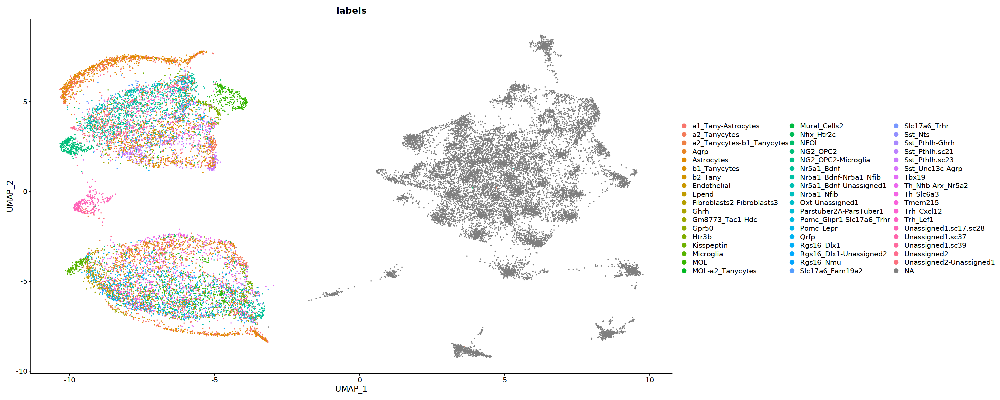

In [584]:
options(repr.plot.width=25, repr.plot.height=10)
DimPlot(merged_obj, reduction = "umap", group.by = "labels", repel = TRUE)


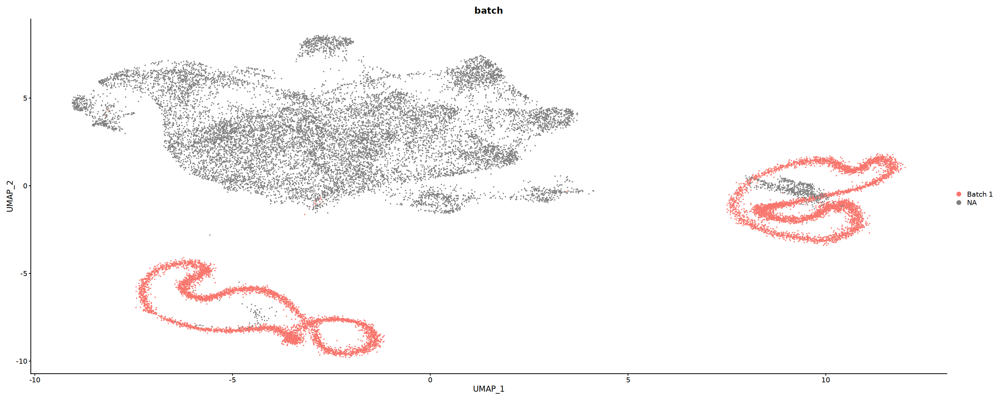

In [546]:
options(repr.plot.width=25, repr.plot.height=10)
DimPlot(merged_obj, reduction = "umap", group.by = "batch", repel = TRUE)


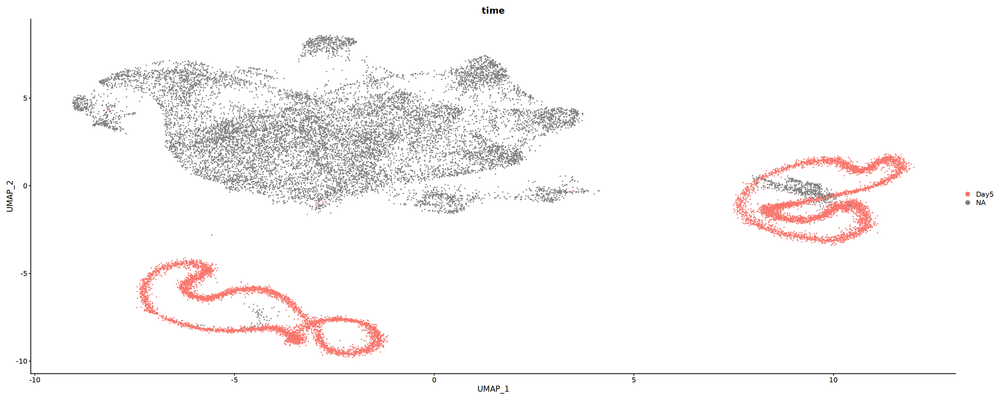

In [547]:
options(repr.plot.width=25, repr.plot.height=10)
DimPlot(merged_obj, reduction = "umap", group.by = "time", repel = TRUE)


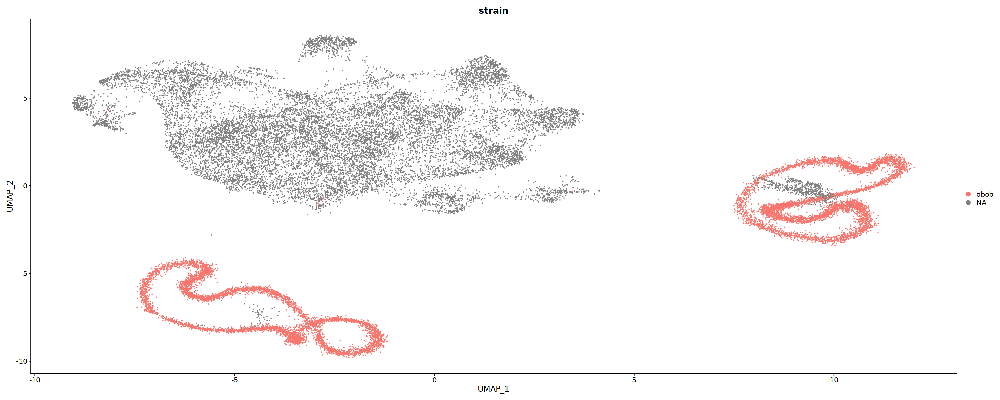

In [548]:
options(repr.plot.width=25, repr.plot.height=10)
DimPlot(merged_obj, reduction = "umap", group.by = "strain", repel = TRUE)


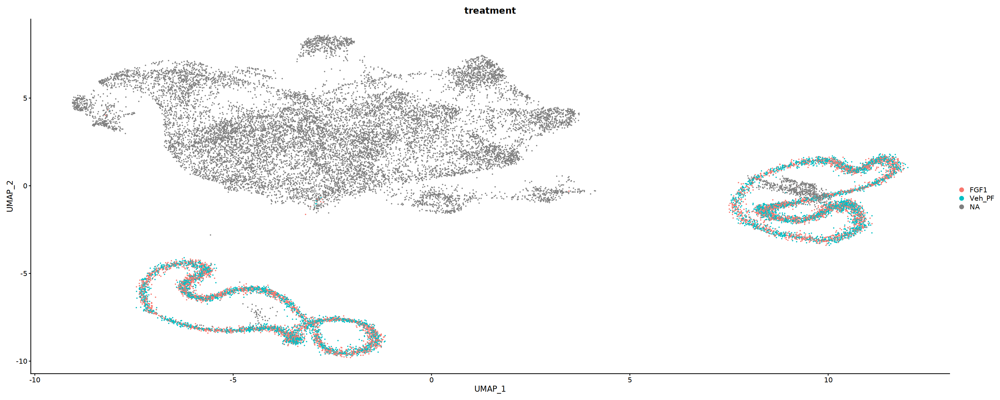

In [549]:
options(repr.plot.width=25, repr.plot.height=10)
DimPlot(merged_obj, reduction = "umap", group.by = "treatment", repel = TRUE)


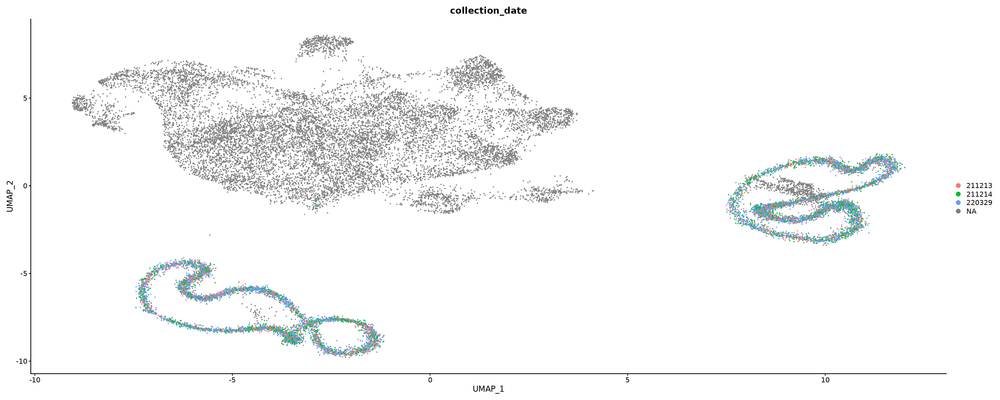

In [550]:
options(repr.plot.width=25, repr.plot.height=10)
DimPlot(merged_obj, reduction = "umap", group.by = "collection_date", repel = TRUE)


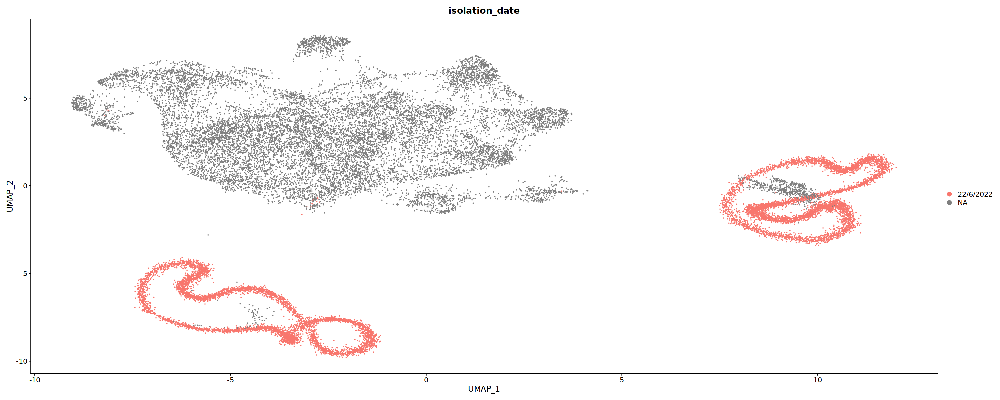

In [551]:
options(repr.plot.width=25, repr.plot.height=10)
DimPlot(merged_obj, reduction = "umap", group.by = "isolation_date", repel = TRUE)


In [522]:
only_spatial_cells = merged_obj %>%
`[[` %>%
filter(is.na(batch)) %>%
rownames

In [523]:
merged_obj_osc = subset(merged_obj, cells=only_spatial_cells)
merged_obj_osc

An object of class Seurat 
58507 features across 14373 samples within 7 assays 
Active assay: integrated (3434 features, 0 variable features)
 6 other assays present: RNA, SCT, Xenium, BlankCodeword, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 2 spatial fields of view present: fov zoom

In [ ]:


merged_obj_osc

In [557]:
xenium_genes = merged_obj_osc@assays$Xenium@meta.features %>% rownames
DefaultAssay(merged_obj_osc) = 'SCT'
merged_obj_osc = RunUMAP(merged_obj_osc, features = xenium_genes)

17:41:19 UMAP embedding parameters a = 0.9922 b = 1.112

17:41:19 Read 14373 rows and found 100 numeric columns

17:41:19 Using Annoy for neighbor search, n_neighbors = 30

17:41:20 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:41:23 Writing NN index file to temp file /scratch/nmq407/R_tmp//Rtmp4v1Tp1/file150e934d4b232

17:41:23 Searching Annoy index using 1 thread, search_k = 3000

17:41:33 Annoy recall = 100%

17:41:35 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:41:39 Initializing from normalized Laplacian + noise (using irlba)

17:41:41 Commencing optimization for 200 epochs, with 693536 positive edges

17:42:06 Optimization finished



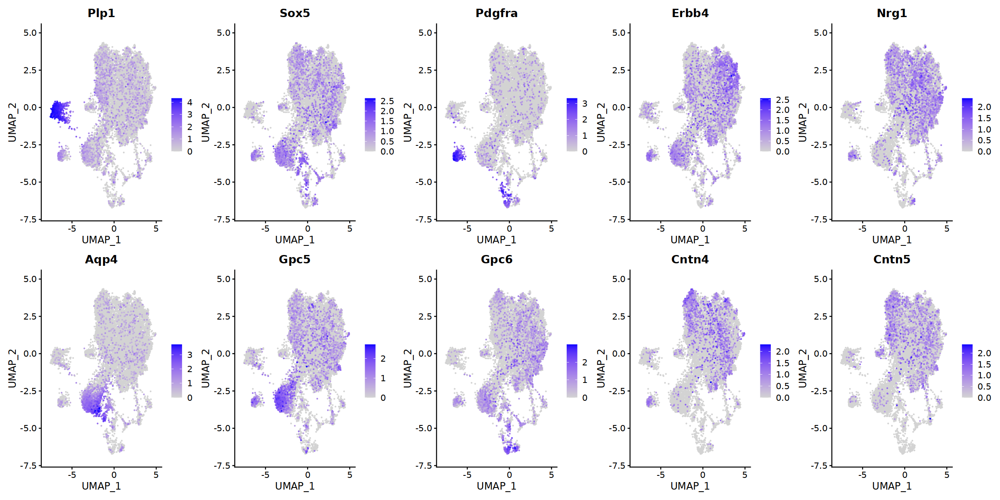

In [558]:
# FeaturePlot(xe_obj, top_neuron_markers, reduction = "umap", ncol = 5, order=TRUE)
options(repr.plot.width=20, repr.plot.height=10)

FeaturePlot(merged_obj_osc,
            c("Plp1", "Sox5", "Pdgfra", "Erbb4", "Nrg1", "Aqp4", "Gpc5", "Gpc6", "Cntn4", "Cntn5"),
            reduction = "umap",
            ncol=5, 
            order=TRUE)

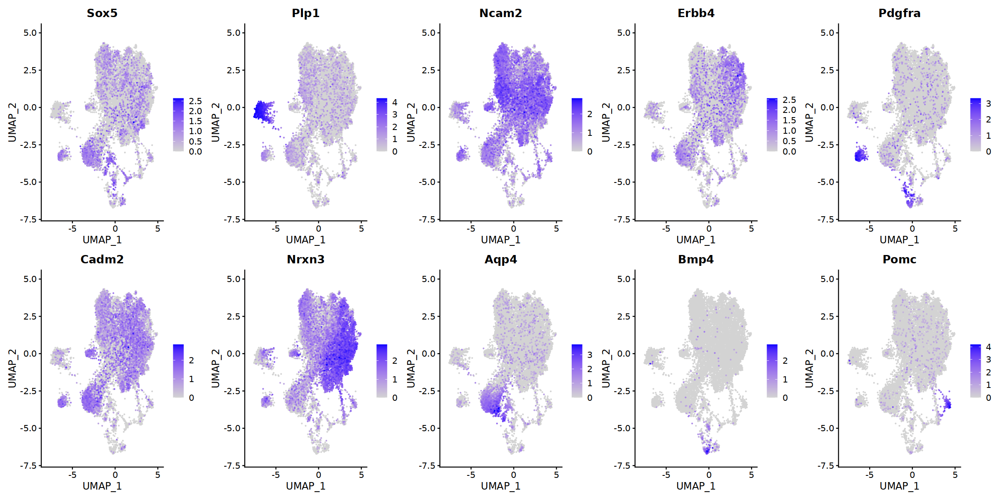

In [564]:
marker_genes <- c("Sox5", "Plp1", "Ncam2", "Erbb4", "Pdgfra", "Cadm2", "Nrxn3", "Aqp4", "Bmp4", "Pomc")


options(repr.plot.width=20, repr.plot.height=10)

FeaturePlot(merged_obj_osc,
            marker_genes,
            reduction = "umap",
            ncol=5, 
            order=TRUE)

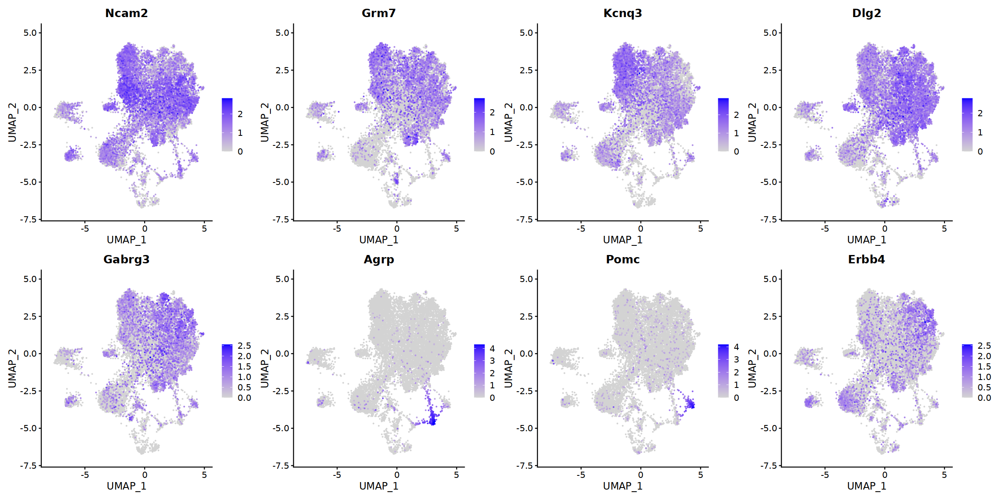

In [560]:

# FeaturePlot(xe_obj, top_neuron_markers, reduction = "umap", ncol = 5, order=TRUE)
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(merged_obj_osc,
            c("Ncam2", "Grm7", "Kcnq3", "Dlg2", "Gabrg3", "Agrp", "Pomc", "Erbb4"),
            reduction = "umap",
            ncol=4, 
            order=TRUE)

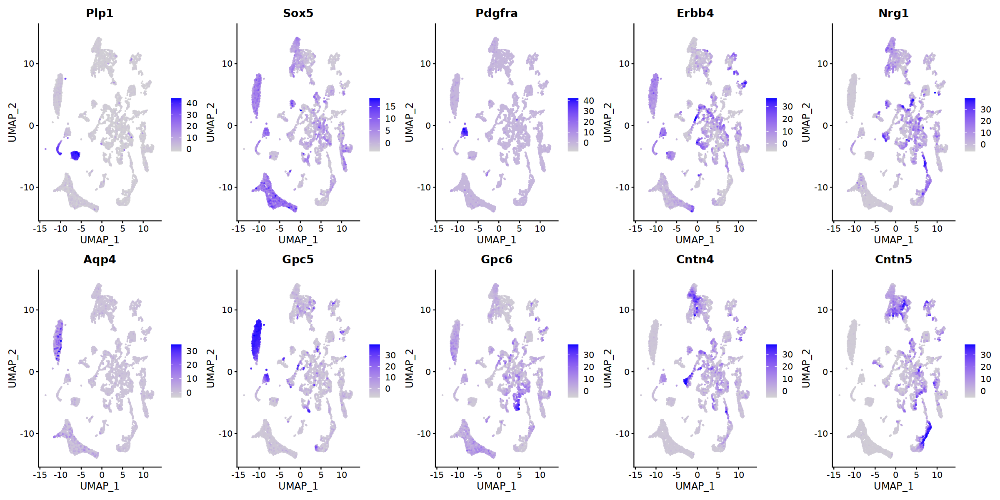

In [526]:
# FeaturePlot(xe_obj, top_neuron_markers, reduction = "umap", ncol = 5, order=TRUE)
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(ref_obj,
            c("Plp1", "Sox5", "Pdgfra", "Erbb4", "Nrg1", "Aqp4", "Gpc5", "Gpc6", "Cntn4", "Cntn5"),
            reduction = "umap",
            ncol=5, 
            order=TRUE)

Warning message:
“Found the following features in more than one assay, excluding the default. We will not include these in the final data frame: Agrp, Nr5a1”
Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Agrp, Nr5a1”


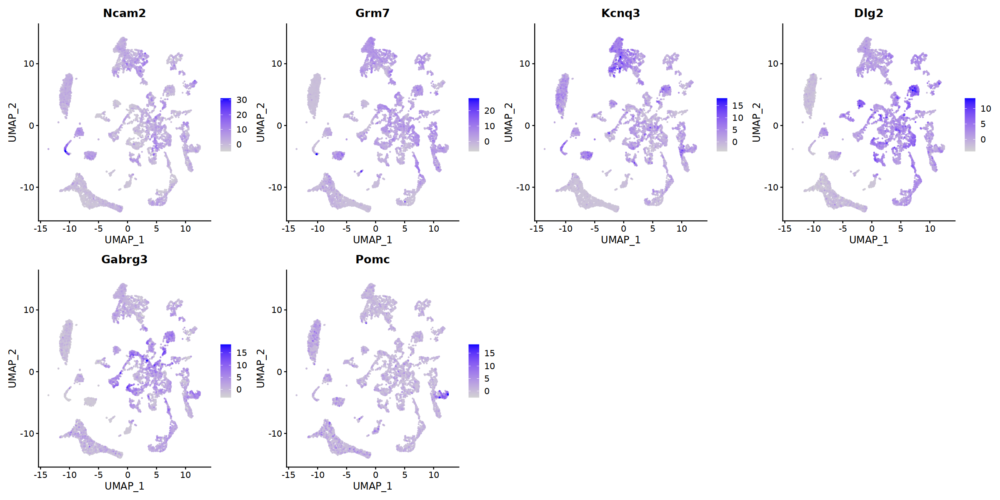

In [527]:

# FeaturePlot(xe_obj, top_neuron_markers, reduction = "umap", ncol = 5, order=TRUE)
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(ref_obj,
            c("Ncam2", "Grm7", "Kcnq3", "Dlg2", "Gabrg3", "Agrp", "Pomc", "Nr5a1"),
            reduction = "umap",
            ncol=4, 
            order=TRUE)

In [479]:
merged_obj %>% `[[` %>% colnames

[1] "orig.ident"                    "nCount_RNA"                   
 [3] "nFeature_RNA"                  "Index.10x"                    
 [5] "nCount_HTO"                    "nFeature_HTO"                 
 [7] "Index.HTO"                     "nCount_spliced"               
 [9] "nFeature_spliced"              "nCount_unspliced"             
[11] "nFeature_unspliced"            "HTO_mcl_maxID"                
[13] "HTO_mcl_secondID"              "HTO_mcl_margin"               
[15] "HTO_mcl_classification"        "HTO_mcl_classification.global"
[17] "hash.mcl.ID"                   "doublet"                      
[19] "predicted_dub_std"             "predicted_dub_cut"            
[21] "predicted_dub_all"             "nCount_SCT"                   
[23] "nFeature_SCT"                  "SCT_snn_res.0.8"              
[25] "seurat_clusters"               "strain"                       
[27] "treatment"                     "time"                         
[29] "collection_date"               "isolation_date"               
[31] "batch"                         "predicted.id"                 
[33] "prediction.score.max"          "labels"                       
[35] "cell_class"                    "polar_label"                  
[37] "nCount_integrated"             "nFeature_integrated"          
[39] "nCount_Xenium"                 "nFeature_Xenium"              
[41] "nCount_BlankCodeword"          "nFeature_BlankCodeword"       
[43] "nCount_ControlCodeword"        "nFeature_ControlCodeword"     
[45] "nCount_ControlProbe"           "nFeature_ControlProbe"        
[47] "SCT_snn_res.0.3"

In [480]:
merged_obj

An object of class Seurat 
58507 features across 25084 samples within 7 assays 
Active assay: integrated (3434 features, 0 variable features)
 6 other assays present: RNA, SCT, Xenium, BlankCodeword, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 2 spatial fields of view present: fov zoom

In [326]:
xe

class: SingleCellExperiment 
dim: 100 14373 
metadata(0):
assays(2): counts logcounts
rownames(100): Sorcs1 Lingo2 ... Csmd1 Lmx1a
rowData names(0):
colnames(14373): Cell1_4012_26 Cell2_4020_72 ... Cell18970_4963_1934
  Cell18974_10371_1594
colData names(14): orig.ident nCount_Xenium ... seurat_clusters ident
reducedDimNames(1): corral
mainExpName: Xenium
altExpNames(4): BlankCodeword ControlCodeword ControlProbe SCT

In [567]:
xe.countmat <- assay(xe,'counts')
xe.countcorral <- corral(xe.countmat, smooth=TRUE, ncomp=99)

Warning message in irlba::irlba(mat, nv = ncomp, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”


In [569]:
xe

class: SingleCellExperiment 
dim: 100 14373 
metadata(0):
assays(2): counts logcounts
rownames(100): Sorcs1 Lingo2 ... Csmd1 Lmx1a
rowData names(0):
colnames(14373): Cell1_4012_26 Cell2_4020_72 ... Cell18970_4963_1934
  Cell18974_10371_1594
colData names(14): orig.ident nCount_Xenium ... seurat_clusters ident
reducedDimNames(0):
mainExpName: Xenium
altExpNames(4): BlankCodeword ControlCodeword ControlProbe SCT

In [367]:
var_explained = xe.countcorral$pct_var_exp %>% t %>% as.data.frame 
var_explained$pc = 1:99
var_explained %>% head %>% print

    percent.Var.explained cumulative.Var.explained pc
PC1            0.09229356               0.09229356  1
PC2            0.04486867               0.13716223  2
PC3            0.03708192               0.17424415  3
PC4            0.02598400               0.20022815  4
PC5            0.02525270               0.22548085  5
PC6            0.02347296               0.24895381  6


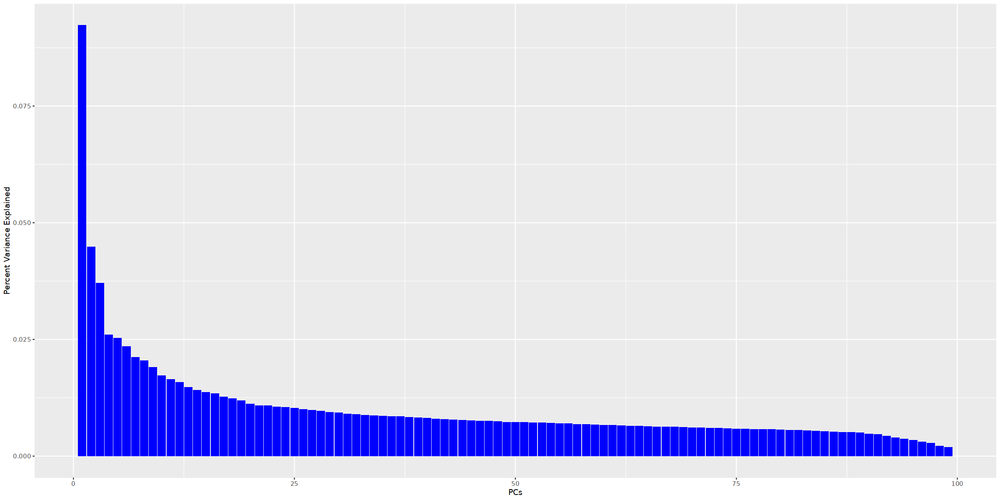

In [368]:
ggplot(data = var_explained, aes(x = pc, y = percent.Var.explained)) +
  geom_col(fill = "blue") +
  xlab("PCs") +
  ylab("Percent Variance Explained")

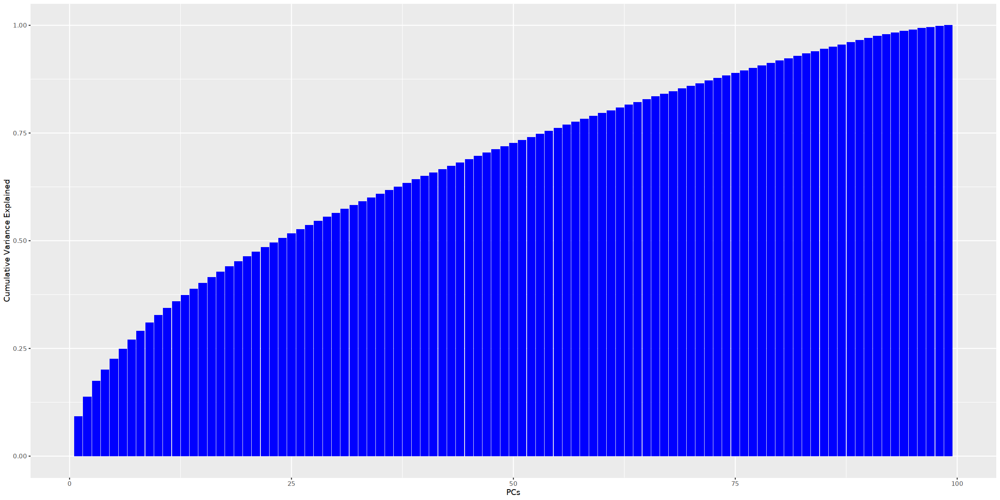

In [370]:
ggplot(data = var_explained, aes(x = pc, y = cumulative.Var.explained)) +
  geom_col(fill = "blue") +
  xlab("PCs") +
  ylab("Cumulative Variance Explained")

In [331]:
xe_obj

An object of class Seurat 
499 features across 14373 samples within 5 assays 
Active assay: Xenium (100 features, 0 variable features)
 4 other assays present: BlankCodeword, ControlCodeword, ControlProbe, SCT
 2 dimensional reductions calculated: pca, umap
 2 spatial fields of view present: fov zoom

In [371]:
cell.embeddings = xe.countcorral$v
dro = CreateDimReducObject(embeddings = cell.embeddings, key = "PC_", assay = DefaultAssay(xe_obj))
xe_obj[['pca']] = dro

Warning message:
“No columnames present in cell embeddings, setting to 'PC_1:99'”


In [372]:
xe_obj = RunUMAP(xe_obj, dims=1:99)

15:31:30 UMAP embedding parameters a = 0.9922 b = 1.112

15:31:30 Read 14373 rows and found 99 numeric columns

15:31:30 Using Annoy for neighbor search, n_neighbors = 30

15:31:30 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:31:32 Writing NN index file to temp file /scratch/nmq407/R_tmp//Rtmp4v1Tp1/file150e9436f6fe6

15:31:32 Searching Annoy index using 1 thread, search_k = 3000

15:31:40 Annoy recall = 100%

15:31:42 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:31:46 Initializing from normalized Laplacian + noise (using irlba)

15:31:46 Commencing optimization for 200 epochs, with 586142 positive edges

15:32:08 Optimization finished



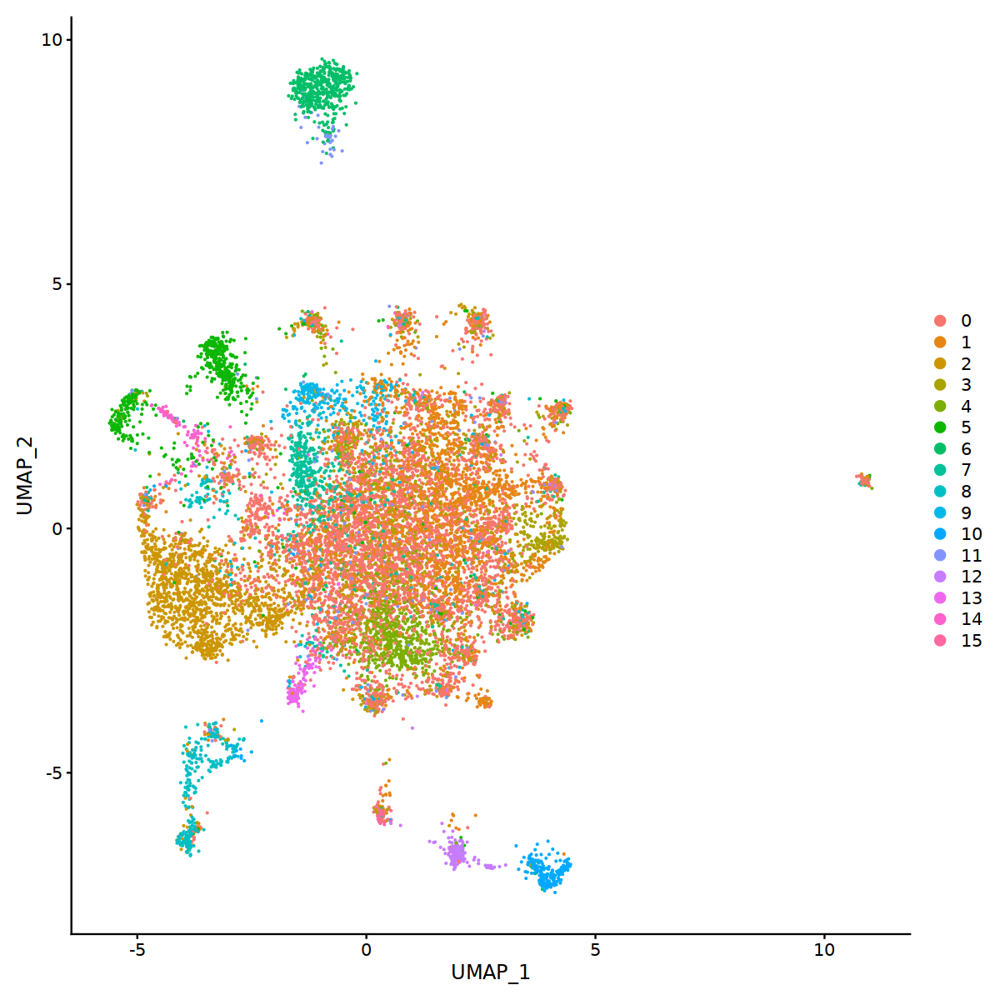

In [373]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(xe_obj, reduction = "umap")


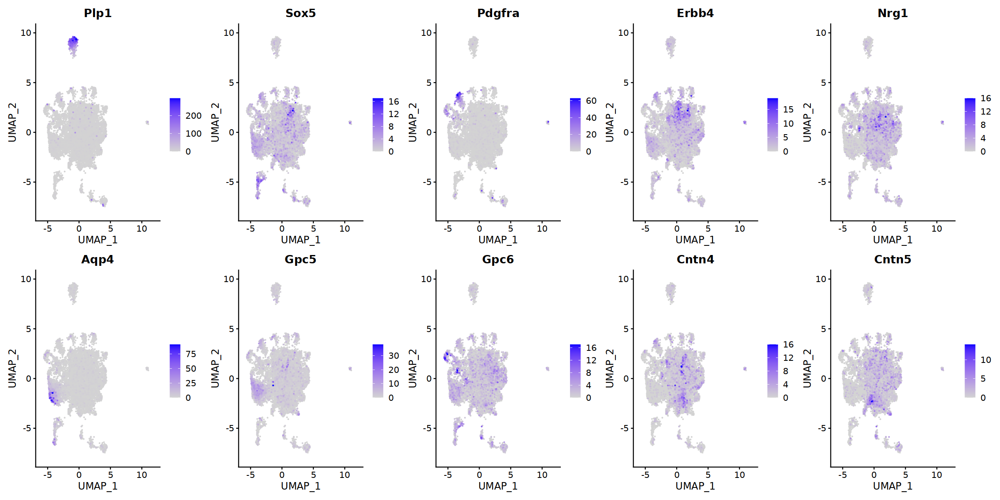

In [376]:
# FeaturePlot(xe_obj, top_neuron_markers, reduction = "umap", ncol = 5, order=TRUE)
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(xe_obj,
            c("Plp1", "Sox5", "Pdgfra", "Erbb4", "Nrg1", "Aqp4", "Gpc5", "Gpc6", "Cntn4", "Cntn5"),
            reduction = "umap",
            ncol=5, 
            order=TRUE)

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Nr5a1”


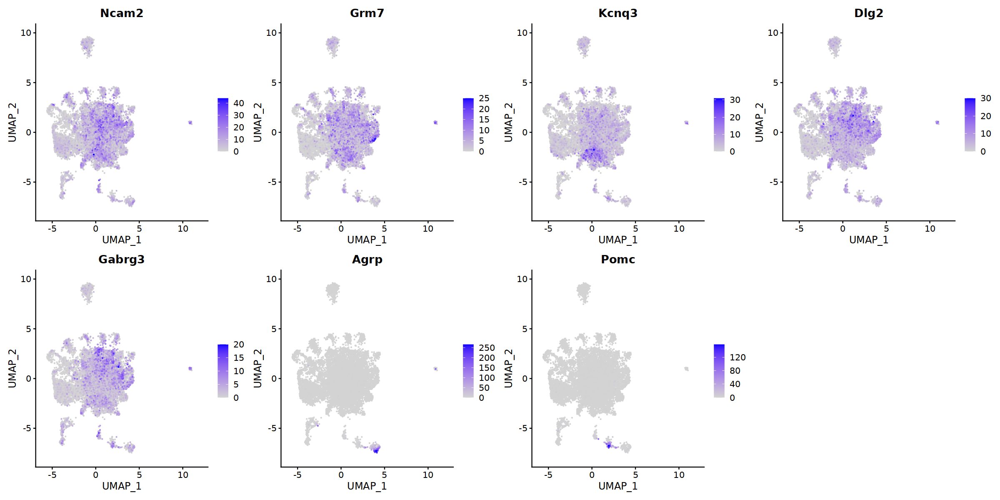

In [377]:

# FeaturePlot(xe_obj, top_neuron_markers, reduction = "umap", ncol = 5, order=TRUE)
options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(xe_obj,
            c("Ncam2", "Grm7", "Kcnq3", "Dlg2", "Gabrg3", "Agrp", "Pomc", "Nr5a1"),
            reduction = "umap",
            ncol=4, 
            order=TRUE)

In [327]:
?as.SingleCellExperiment

as.SingleCellExperiment {Seurat},R Documentation
x,An object to convert to class SingleCellExperiment
...,Arguments passed to other methods
assay,Assays to convert


In [ ]:
corralm_sce